# Assignment 1:  Superpixels and Image Segmentation.

Name: **Rohan Maan**

UID:  **119061770**

Link to Google Drive : https://colab.research.google.com/drive/1unNZK-6pcFiqWh_kPjlNiGGUnhZJ3nJJ?usp=sharing

Please submit a PDF containing all outputs to gradescope by **October 5, 11:59pm**

----------------------------

In this assignment, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

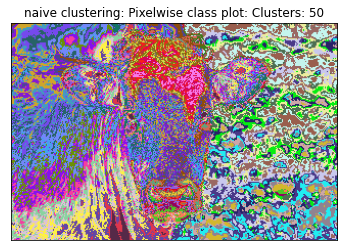

You will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

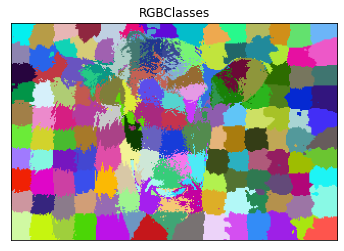

You will then build a segmentation network by training a deep neural network on your superpixels. This part is fairly open-ended, feel free to try any model you can think of (GNN, CNN, Transformer, etc.).

To give an example, for a CNN-based system that reformulates segmentation as superpixel image classification, there are basically three steps in the training stage:

1. Dilate and save each superpixel region from SLIC output into image of size 224X224, alongwith the ground truth segments label.
2. Build a couple of convolution layers to extract the deep features from each Superpixel patch image. Let the last layer be Fully connected layers.
3. Define the segmentation loss as multi-class classification loss and train a convolutional neural network based classifier.

Then, during inference, you would combine the classifier's predicted labels to form the whole input image's Superpixel segmentation results.

## Part 1: Superpixels

For this first part of the assignment, you will implement 2 superpixels methods: k-means pixel clustering, and SLIC.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/CMSC828I/

Mounted at /content/drive
/content/drive/MyDrive/CMSC828I


### Data

First, we download the MSRC labeled imaged database.

In [ ]:
# !wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
# !unzip --qq msrc_objcategimagedatabase_v1.zip

For the first part of this assignment, we will only use the following images. We define the list below as `im_list`.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [ ]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im, title, xticks = [], yticks = [], isCv2 = True):
    """
    im :Image to plot
    title : Title of image
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm),
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value

    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot

    Output: None
    Creates a plot
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]

    plot_image(seg_img,title)

    return

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust}
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot:
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

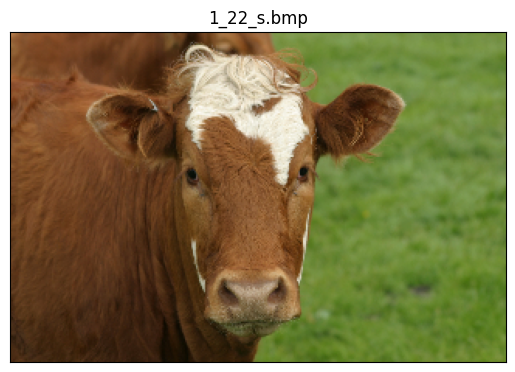

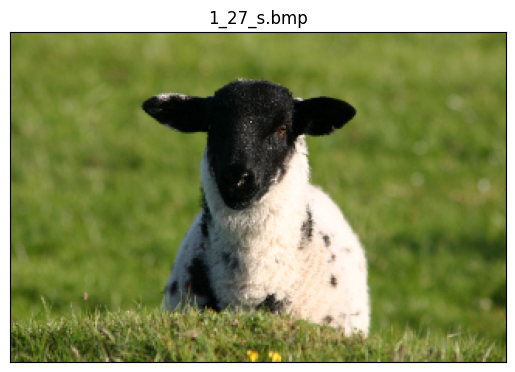

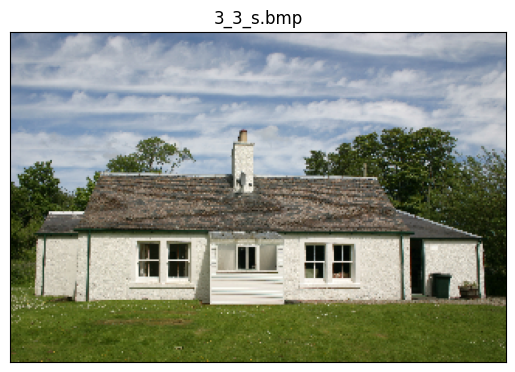

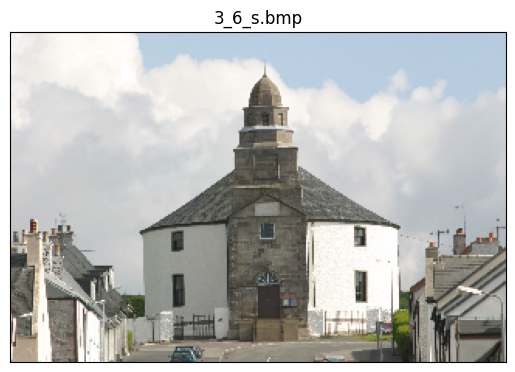

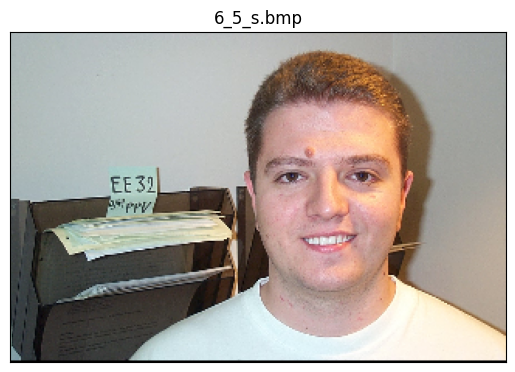

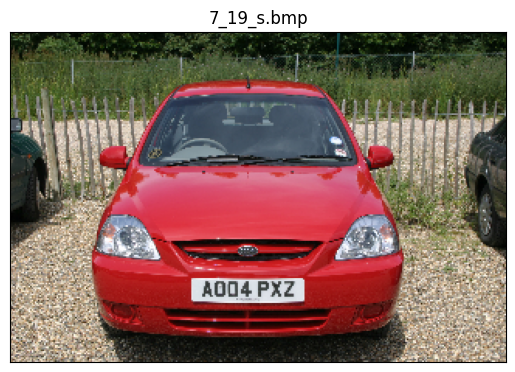

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

### Question 1: Perform k-means on image pixels `(r, g, b, x, y)`. (40 points)

The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b, x, y)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 25, 50, 150`.




<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

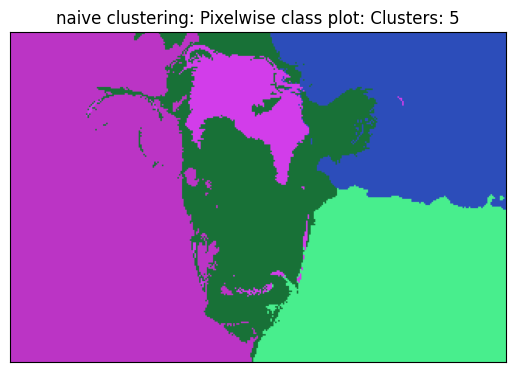

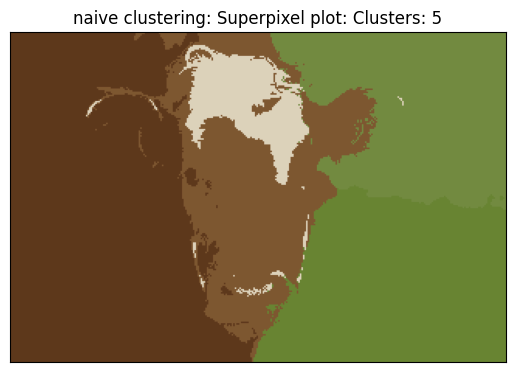

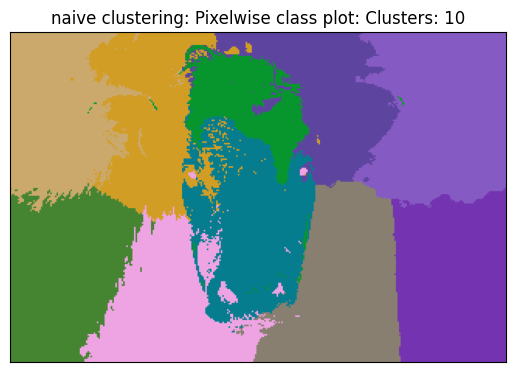

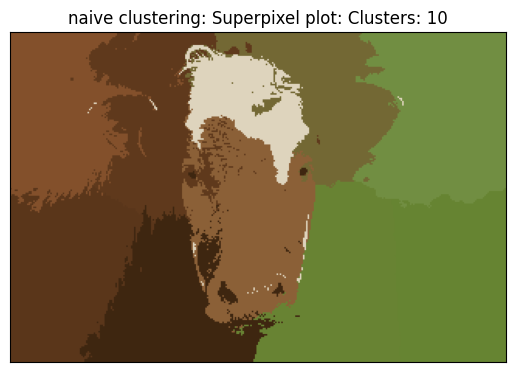

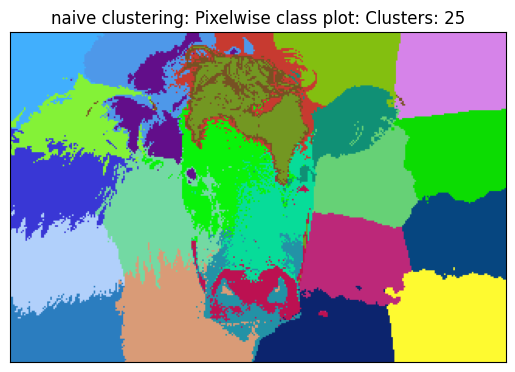

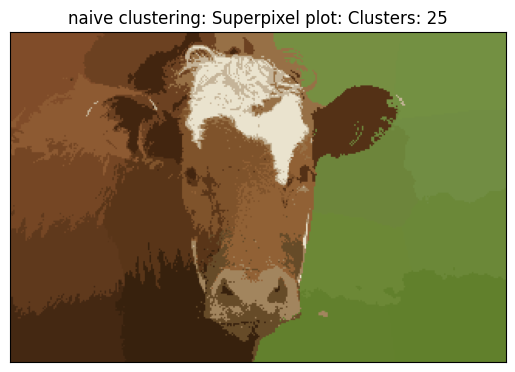

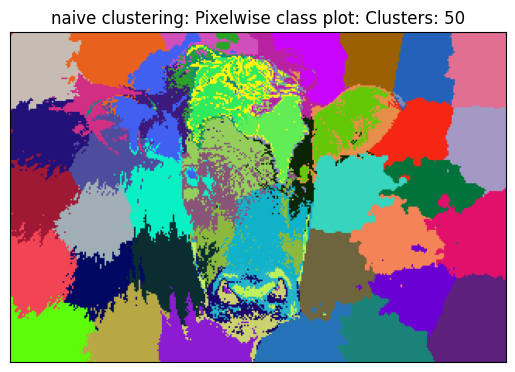

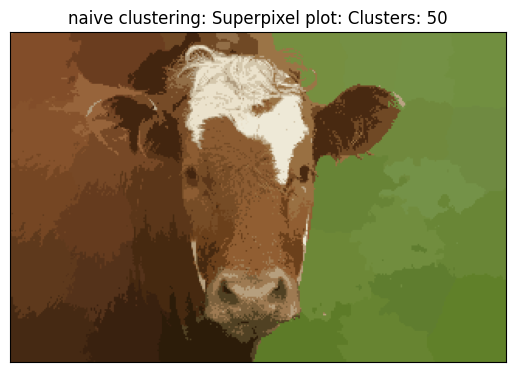

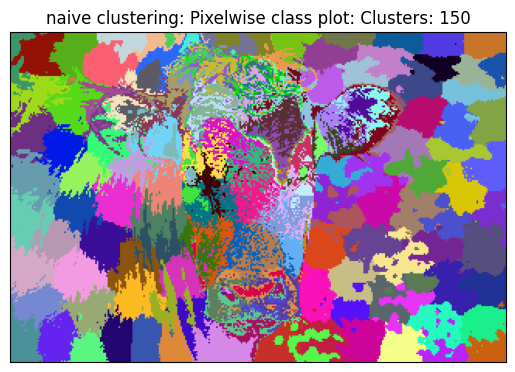

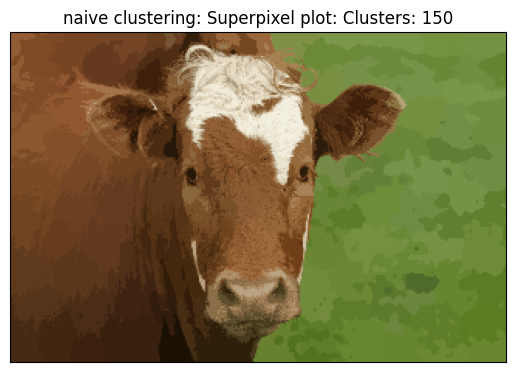

In [ ]:
from enum import auto
from sklearn.cluster import KMeans
import numpy as  np

def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    # assert 1==2," NOT IMPLEMENTED"
    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    row,col,_ = im.shape
    new_image = np.array([[0]*5] * (row*col))

    count = 0
    for r in range(row):
      for c in range(col):
          new_image[count] = [im[r][c][0], im[r][c][1], im[r][c][2], r, c]
          count +=1

    segmap = KMeans(n_clusters=k, n_init='auto').fit(new_image)
    segmap = np.array(segmap.labels_)
    segmap = segmap.reshape((row, col))
    return segmap

im = cv2.imread(im_list[0])
for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

Pick your favorite superpixel **k** value and plot results for all 6 images in `im_list`.

<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

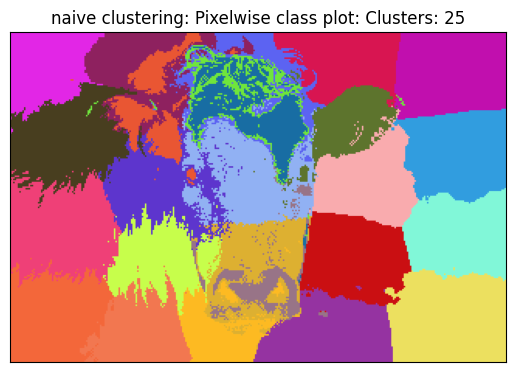

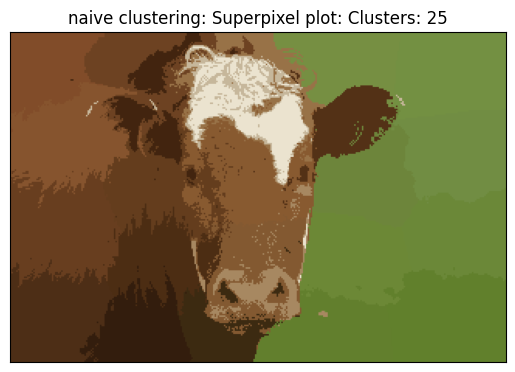

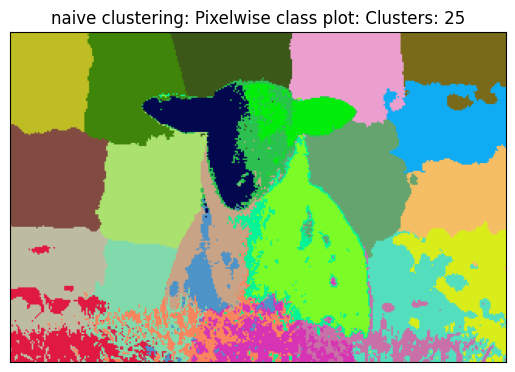

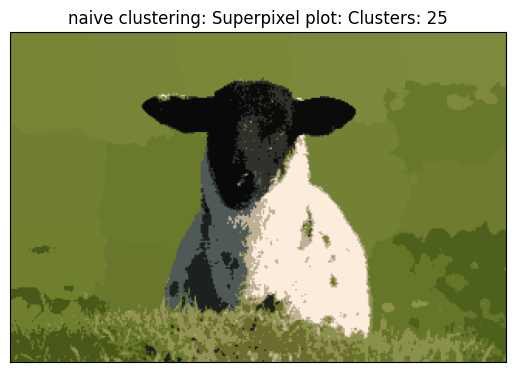

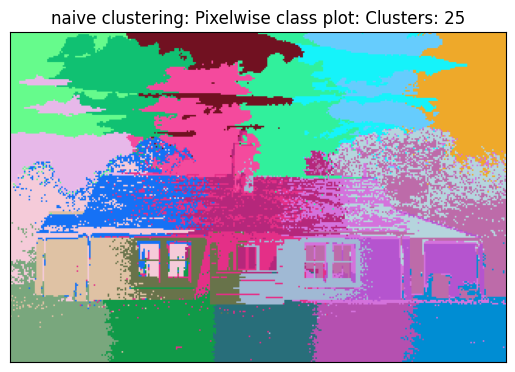

...

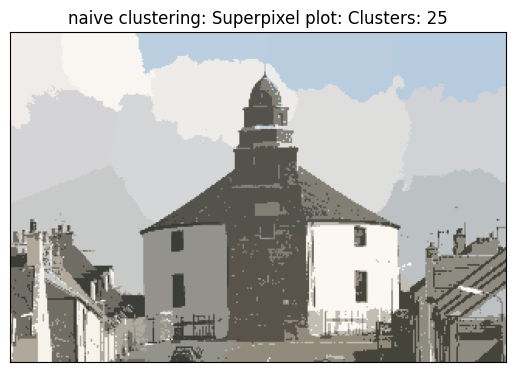

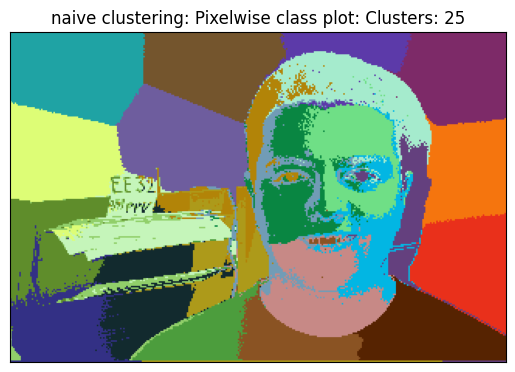

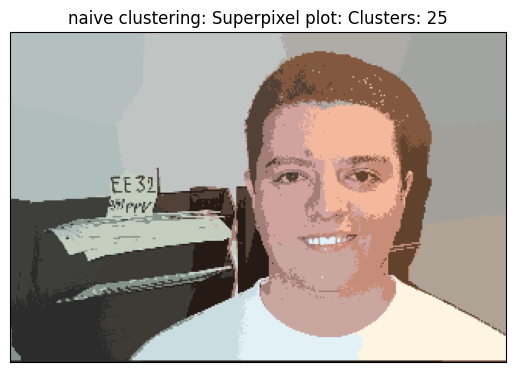

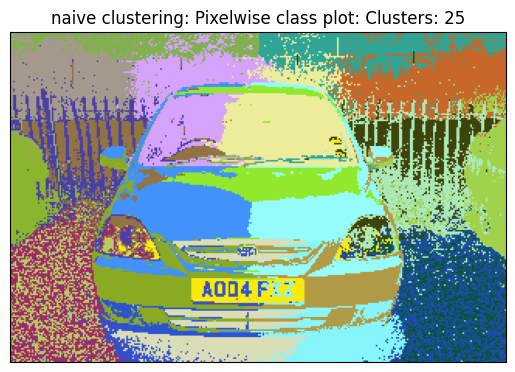

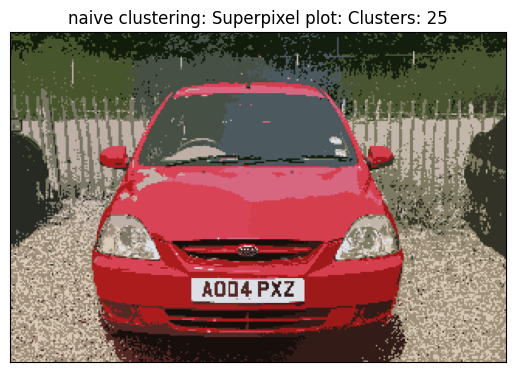

In [ ]:
# TODO: plot for 6 images with chosen k value
k = 25

for i in im_list:
  im = cv2.imread(i)
  clusters = cluster_rgbxy(im,k)
  _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Question 2: Replicate SLIC and Show Results for 6 Images (50 points)

It doesn't look like we have a very favourable outcome with superpixels being implemented with simple clustering. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

In [ ]:
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S.
####  Assign to nearest cluster
##calculate new cluster center

import math
from numpy.linalg import norm
from copy import copy
import cv2

class Cluster:
    def __init__(self, color, xy):
        self.color = color
        self.xy = xy

class pixels:
    def __init__(self, color, xy):
        self.color = color
        self.xy = xy

def compute_dist(pix, center, m, S):
    color_dist = np.linalg.norm(pix.color - center.color)
    xy_dist = np.linalg.norm(pix.xy - center.xy)
    total_dist = (color_dist) + ((m/S) * (xy_dist))
    return total_dist

def coord_map(row, col):
    xy_map = []
    for i in range(row):
        xy_list = []
        for j in range(col):
            xy_list.append([i,j])
        xy_map.append(xy_list)
    xy_map = np.array(xy_map)
    return xy_map

def min_gradient(im, height, width, cluster):
    x, y = cluster.xy
    color_val = cluster.color
    min_grad = math.inf

    # check in 3x3 window for minimum gradient
    for i in range(x-1, x+2):
        for j in range(y-1, y+2):
            # takes care of corner cases
            im = cv2.copyMakeBorder(im, 1, 1, 1, 1, cv2.BORDER_DEFAULT)
            gradient = (np.linalg.norm(im[i+1, j] - im[i-1, j])**2 + np.linalg.norm(im[i, j+1] - im[i, j-1])**2)
            if gradient < min_grad:
                min_grad = gradient
                cluster.xy = np.array([i, j])
                cluster.color = im[i, j]
    return cluster

def get_initial_clusters(S, image):
    row, col, _ = image.shape
    clusters = []
    for i in range(S//2, row, S):
        for j in range(S//2, col, S):
            color = image[i,j]
            clust = Cluster(color, np.array([i,j]))
            clust = min_gradient(image, row, col, clust)
            clusters.append(clust)
    return clusters

def SLIC(im, k):
    """
    Input arguments:
    im: image input
    k: number of cluster segments

    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..

    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """

    # value used from paper
    m=10

    row, col, _ = im.shape
    seg_map = -1 * np.ones((row, col))

    #stores the minimum distance from nearest cluster
    distance_map =  math.inf * np.ones((row, col))

    # S = sqrt(N/K) as given in paper
    S = int(math.sqrt(row*col/k))
    clusters = get_initial_clusters(S, im)

    # suggested 10 iterations in the paper being enough for most operations
    for iter in range(10):
        for idx, cluster in enumerate(clusters):
            x, y = cluster.xy
            x, y = int(x), int(y)
            for i in range(x-S, x+S):
                for j in range(y-S, y+S):
                    i = max(0, min(i, row - 1))
                    j = max(0, min(j, col - 1))
                    pixel_color = im[i,j]
                    currrent_pixel = pixels(pixel_color, np.array([i,j]))
                    centroid_pixel = pixels(cluster.color, cluster.xy)
                    dist = compute_dist(currrent_pixel, centroid_pixel, m, S)
                    if dist < distance_map[i,j]:
                        distance_map[i,j] = dist
                        seg_map[i,j] = idx + 1

        # stores cluster number to which each pixel belongs
        coordinate_map = coord_map(row, col)

        # update cluster allocation
        for idx, cluster in enumerate(clusters):
            check = (seg_map == (idx+1))
            cluster.color = im[check].mean(axis=0)
            cluster.xy = coordinate_map[check].mean(axis=0)

    return seg_map

With SLIC implemented, plot results for all 6 images.

<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


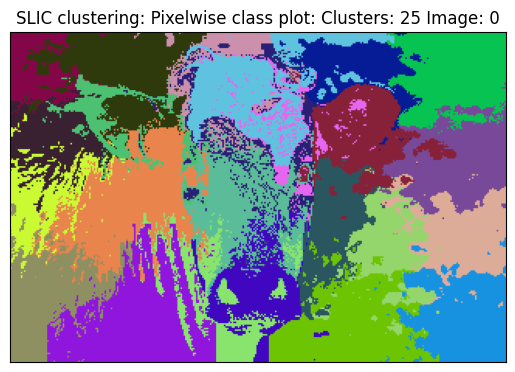

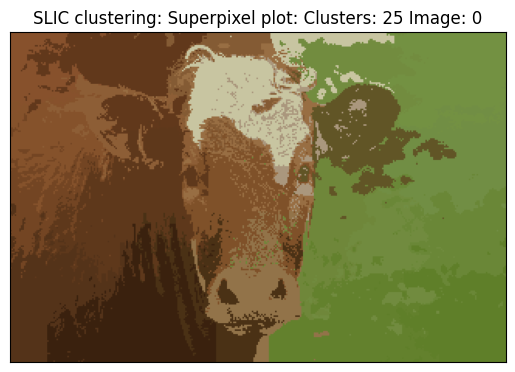

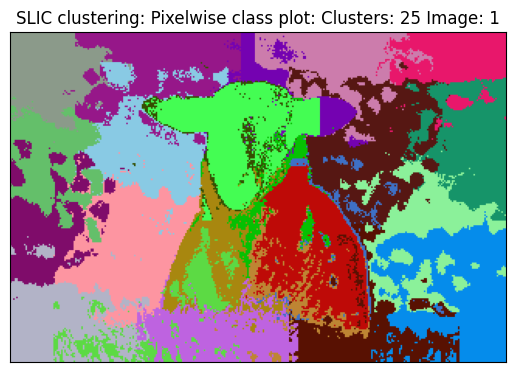

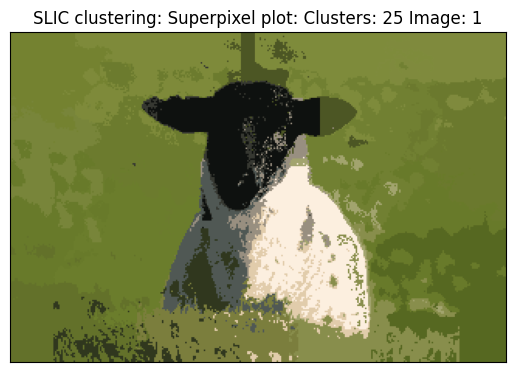

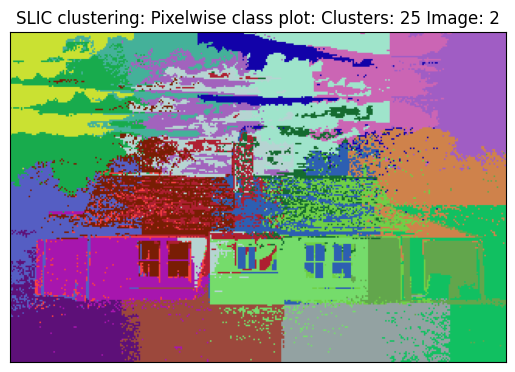

...

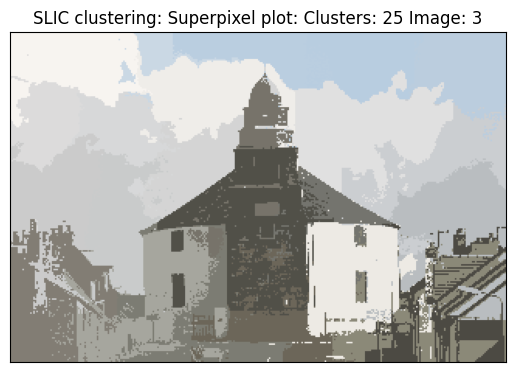

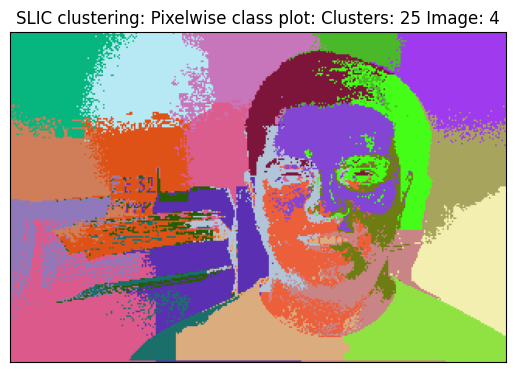

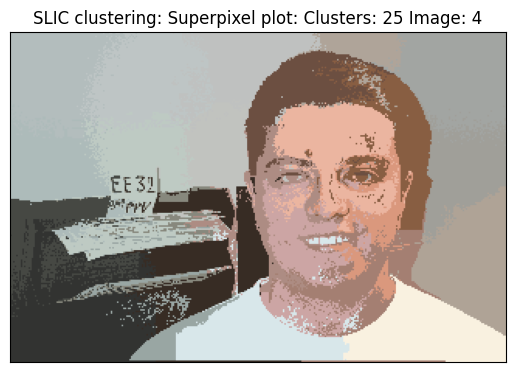

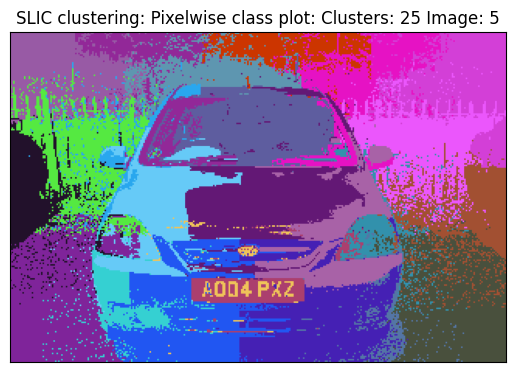

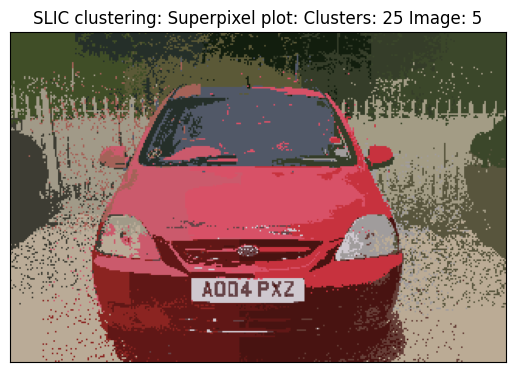

In [ ]:
## TODO: Call our plot functions with your SLIC results for all 6 images
k = 25

for idx, image in enumerate(im_list):
  im = cv2.imread(image)
  im_lab = cv2.cvtColor(im, cv2.COLOR_BGR2LAB)
  segmap = SLIC(im_lab, k)
  _ = rgb_segment(segmap, n=k, title="SLIC clustering: Pixelwise class plot: Clusters: " + str(k) + " Image: " + str(idx), legend=False)
  superpixel_plot(im, segmap, title="SLIC clustering: Superpixel plot: Clusters: " + str(k) + " Image: " + str(idx))

### Question 3: What advantage did the SLIC give compared to `(r, g, b, x, y)`? Please answer in 3 sentences or fewer. (10 points)

Your Answer: compared to kmeans based "r,g,b,x,y" which doesn't take into consideration of any weights, SLIC makes use of a technique of combining color closeness along with the x and y positioning while forming clusters. As the distance equation used in SLIC does not directly rely on each of the axis, we can modify the variable m which helps decide the proximity to which each pixel should extend.

### Bonus Question 4: Enforce connectivity (20 points, OPTIONAL)
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster

Plot results for the 6 images.


In [ ]:
## NOT solving the Bonus question

## Part 2: Segmentation

For this part, you will use your best superpixels to build an image segmentation system. Alternatively, you can use SLIC from some library, as we demonstrate in the Data section that follows.

### Data

This is mostly the same as the last part, except now we also need to consider the annotated ground truth segmentation maps.

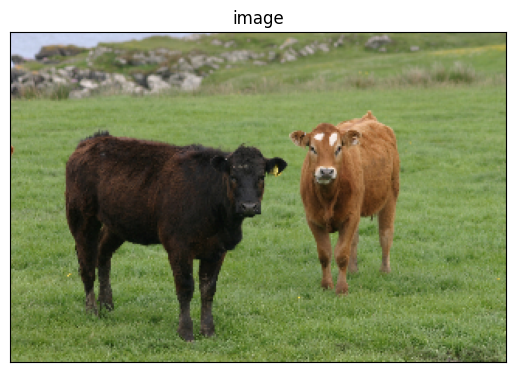

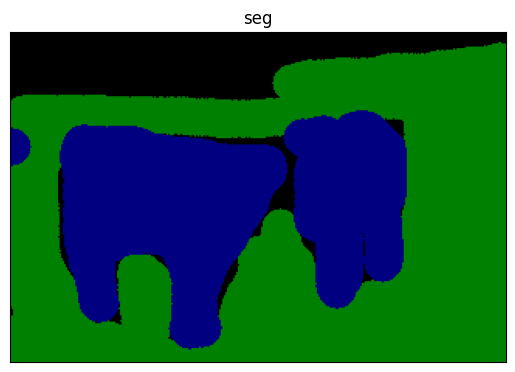

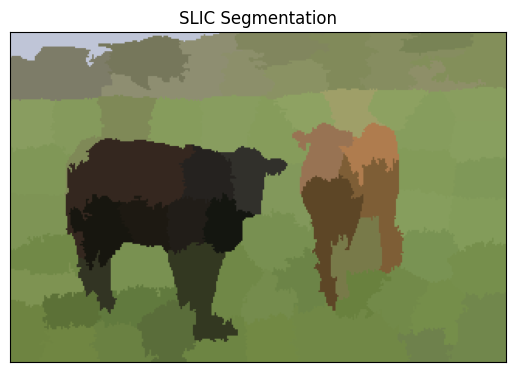

In [ ]:
#  plot a sample image and its ground truth segments
image_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
seg_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
plot_image(image_sample, 'image')
plot_image(seg_sample, 'seg')

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic

segments_sample = slic(image_sample, n_segments=100, compactness=10)
superpixel_plot(image_sample, segments_sample, title = "SLIC Segmentation")

In [ ]:
from IPython import embed
import os
current_directory = os.getcwd()
msrc_directory = current_directory + '/MSRC_ObjCategImageDatabase_v1'

#Superpixel dataset preparation

# from Dataset_v1
SEG_LABELS_LIST_v1 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 5,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 6, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 7, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 8, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 9, "name": "horse",       "rgb_values": [128,   0,    128]},
    {"id": 10, "name": "water",       "rgb_values": [64,   128,    0]},
    {"id": 11, "name": "mountain",       "rgb_values": [64,   0,    0]},
    {"id": 12, "name": "sheep",       "rgb_values": [0,   128,    128]}]

# from Dataset_v2
SEG_LABELS_LIST_v2 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "horse",      "rgb_values": [128, 0,    128]},
    {"id": 5,  "name": "sheep",      "rgb_values": [0,   128,  128]},
    {"id": 6,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 7,  "name": "mountain",   "rgb_values": [64,  0,    0]},
    {"id": 8,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 9,  "name": "water",      "rgb_values": [64,  128,  0]},
    {"id": 10, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 11, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 12, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 13, "name": "flower",     "rgb_values": [64,  128,  128]},
    {"id": 14, "name": "sign",       "rgb_values": [192, 128,  128]},
    {"id": 15, "name": "bird",       "rgb_values": [0,   64,   0]},
    {"id": 16, "name": "book",       "rgb_values": [128, 64,   0]},
    {"id": 17, "name": "chair",      "rgb_values": [0,   192,  0]},
    {"id": 18, "name": "road",       "rgb_values": [128, 64,   128]},
    {"id": 19, "name": "cat",        "rgb_values": [0,   192,  128]},
    {"id": 20, "name": "dog",        "rgb_values": [128, 192,  128]},
    {"id": 21, "name": "body",       "rgb_values": [64,  64,   0]},
    {"id": 22, "name": "boat",       "rgb_values": [192, 64,   0]}]

# create a map rgb_2_label, where mapping the ground truth 3-d array segmentation into a single ID label.
rgb_2_label = {}
label_2_rgb = {}
for i in SEG_LABELS_LIST_v1:
    rgb_2_label[tuple(i['rgb_values'])] = i['id']

for i in SEG_LABELS_LIST_v1:
    label_2_rgb[i['id']] = tuple(i['rgb_values'])

### Question 5: Superpixel Dataset (30 points)

First, we dilate each superpixel and save the output superpixel patch from SLIC into 224X224 size image (after rescaling), alongwith the ground truth segments label.

For the purpose of consistency, we adopt the existing SLIC implementation from the scikit-learn machine learning package.

Suggested algorithm: Save the superpixels along with their segmentation class. You could implement this as follows:

For each image
1. Get superpixels sp_i for image x. We adopt 100 segments in this assignment, 'segments = slic(image, n_segments=100, compactness=10)'.
2. For every superpixel sp_i in the image, \\
    2.1. find the smallest rectangle which can enclose sp_i <br>
    2.2. Dilate the rectangle by 3 pixels.<br>
    2.3. Get the same region from the segmentation image (from the file with similar name with *_GT). The class for this sp_i is mode of segmentation classes in that same region. Save the dilated region as npy (jpg is lossy for such small patches).<br>


Alternatively, you could create a single csv with columns segment patch location, class label for each sp_i of each image.<br>italicized text

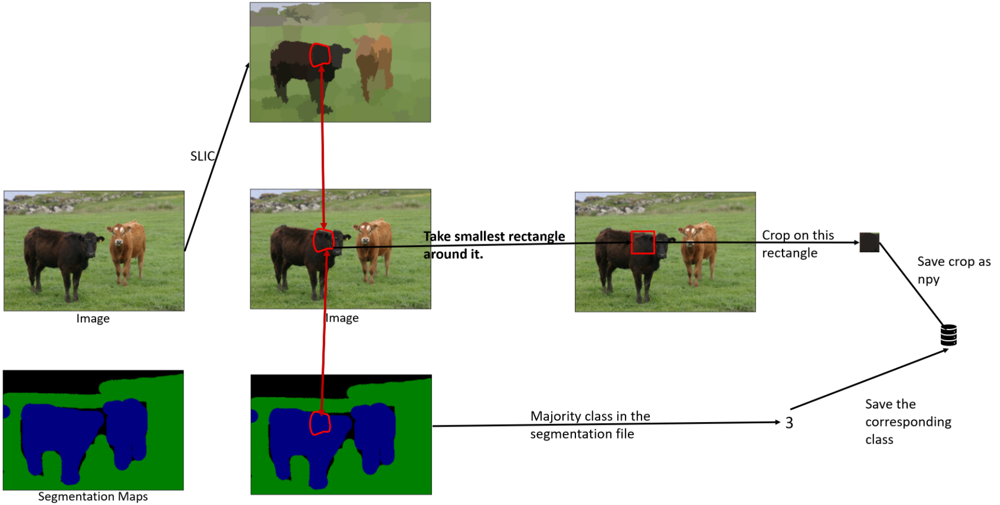


In addition to your code, **the primary graded deliverables** for this question are the 12 demo images we request after you have written code for the dataset.

In [ ]:
# # run SLIC on each original images and save the (segment patch, ID label) pair
# # segments = slic(image, n_segments=100, compactness=10)
# # it may take up to half an hour to process, depending on the hardware resources
# # save the output file names to train.txt
# # Alternatively, you don't save the segment patch and ID label offline, instead,
# # you process them on the fly later.

import statistics as st
import time
from IPython.display import clear_output
import pandas as pd

sample_init = {'image': 'NaN',
  'cluster_num': 0,
  'x': 0,
  'y': 0,
  'w': 0,
  'h': 0,
  'gt_label': 0}
df_sample_init = pd.DataFrame(sample_init, index = [0])

count = 1
for filename in os.listdir(msrc_directory):
    if filename.endswith('_s.bmp'):
      path = msrc_directory + '/' + filename[:-4]
      ground_truth_image = cv2.imread(path + '_GT.bmp')

      image = cv2.imread(msrc_directory +'/' + filename)
      segments = slic(image, n_segments=100, compactness=10)

      unique_vals = np.unique(segments)

      for cluster in unique_vals:
        mask = segments.copy()
        mask[mask!=cluster] = 0

        contours, _ = cv2.findContours(mask, cv2.CV_32SC1, cv2.CHAIN_APPROX_SIMPLE)
        x, y, w, h = cv2.boundingRect(contours[0])

        # edge cases of entering negative x and y
        x = max(0, x)
        y = max(0, y)

        cropped_original_image = image[y:y+h, x:x+w]

        seg_ground = ground_truth_image[y:y+h, x:x+w]
        gt_mask = np.zeros((seg_ground.shape[0], seg_ground.shape[1]))

        for row in range(seg_ground.shape[0]):
          for col in range(seg_ground.shape[1]):
            rgb_values = seg_ground[row][col]
            try:
              gt_mask[row][col] = rgb_2_label[tuple(rgb_values)]
            except:
              gt_mask[row][col] = -1

        seg_ground = np.array(seg_ground)
        gt_label = st.mode(gt_mask.flatten())

        sample = {'image': filename,
          'cluster_num': cluster,
          'x': x,
          'y': y,
          'w': w,
          'h': h,
          'gt_label': gt_label}

        df = pd.DataFrame(sample, index = [count])

        if(count==1):
          final = pd.concat([df_sample_init, df])
        else:
          final = pd.concat([final, df])
        count+=1

final.drop(index=final.index[0], axis=0, inplace=True)
final.to_csv('train.csv')

In [ ]:
import os
import numpy as np
import torch
import torch.utils.data as data
from PIL import Image
from torchvision import transforms
import _pickle as pickle
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F

# -------------
# Dataset class
# -------------
#
# ``torch.utils.data.Dataset`` is an abstract class representing a
# dataset.
# Your custom dataset should inherit ``Dataset`` and override the following
# methods:
#
# -  ``__len__`` so that ``len(dataset)`` returns the size of the dataset.
# -  ``__getitem__`` to support the indexing such that ``dataset[i]`` can
#    be used to get sp_i sample
#
# Let's create a dataset class for our superpixel dataset. We will
# read the csv in ``__init__`` but leave the reading of images to
# ``__getitem__``. This is memory efficient because all the images are not
# stored in the memory at once but read as required.
#
# Sample of our dataset will be a dict
# ``{'superpixel image': image, 'superpixel class': class}``. Our dataset will take an
# optional argument ``transform`` so that any required processing can be
# applied on the sample. Remember to resize the image using ``transform``.

class SegmentationData(data.Dataset):
    def __init__(self, csv_file, image_directory, transform = None):
        self.data = pd.read_csv(csv_file)
        self.folder = image_directory
        self.transform = transform

    def __len__(self):
        return len(set(self.data['image']))

    def __getitem__(self, index):
        idx = index

        images = self.data['image'].unique()
        self.img_name = os.path.join(self.folder, images[idx])

        self.image = cv2.imread(self.img_name)
        useful_data = self.data[self.data['image']==images[idx]]

        X = {}

        for i in range(len(useful_data)):
          inst = useful_data.iloc[i]
          x, y, w, h = int(inst['x']), int(inst['y']), int(inst['w']), int(inst['h'])
          cropped = np.array(self.image[y:y+h, x:x+w])
          cropped = cv2.resize(cropped, (224,224), interpolation=cv2.INTER_LINEAR)
          output = {'superpixel_image': cropped, 'superpixel_class': inst['gt_label']}
          X.update({i: output})
        return X

Show some outputs! Choose 1 image. For that image, plot the image, along with the superpixel map for the image, as you did for Assignment 1. Then, show the first 10 superpixel patches for the image, retrieved from your dataset.

The output for this portion will be 12 images, displayed below your code below.

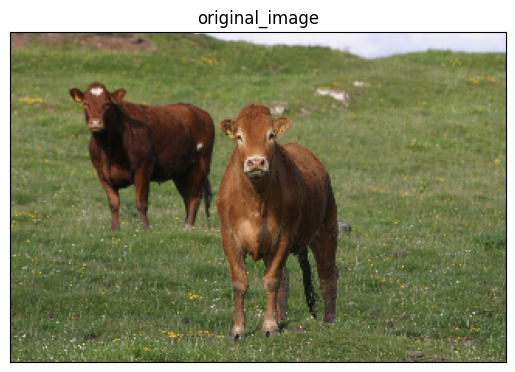

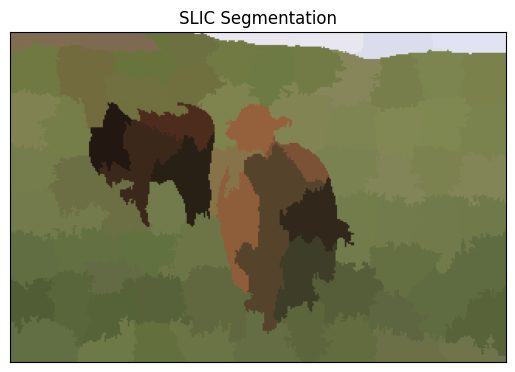

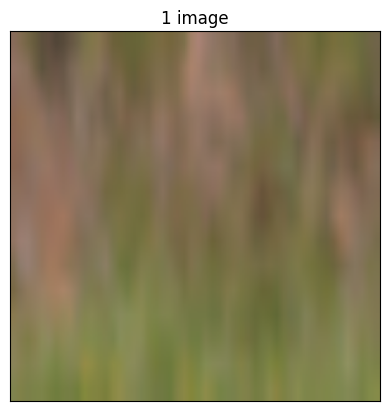

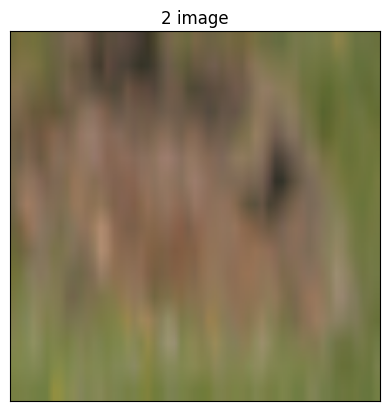

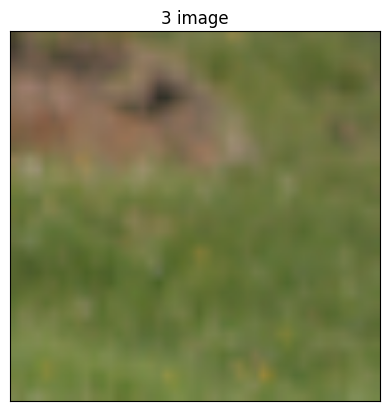

...

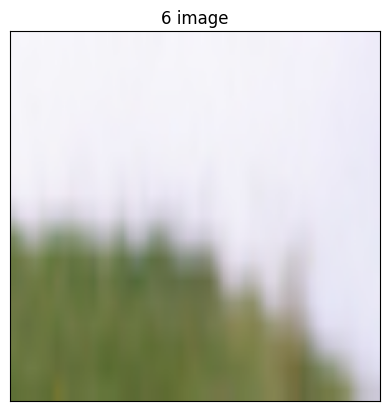

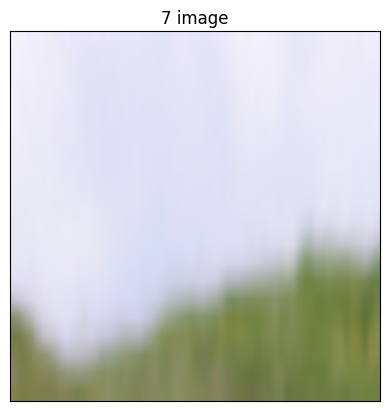

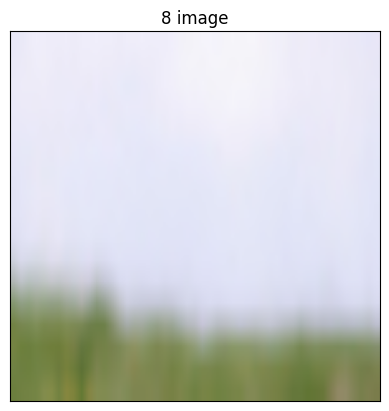

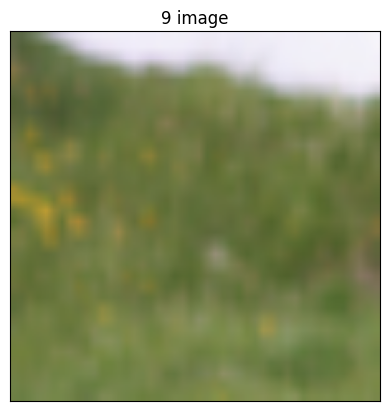

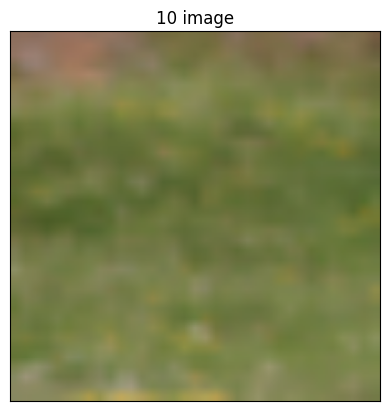

In [ ]:
### YOUR CODE TO PLOT 12 images (original RGB + superpixel map + first 10 superpixels) ###

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic
import pandas as pd

image_chosen = 10

a = SegmentationData('train.csv', msrc_directory, transform=None)

img = a.__getitem__(image_chosen)

orig_img = a.image
plot_image(orig_img, 'original_image')

segments_sample = slic(orig_img, n_segments=100, compactness=10)
superpixel_plot(orig_img, segments_sample, title = "SLIC Segmentation")

for cluster in range(10):
    inst = img[cluster]['superpixel_image']
    plot_image(inst, "%s image"%(cluster+1))

### Question 6: Deep Network (10 points)

You could use a pre-trained network (like VGG) and replace the last few layers with a fully connected layer.

In [ ]:
# Model definition
from keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split

class SegmentationNN(nn.Module):
    def __init__(self):
        self.model = VGG16(input_shape = [224,224,3], weights='imagenet', include_top=False)
        for layers in self.model.layers:
          layers.trainable=False
        x = Flatten()(self.model.output)
        prediction = Dense(len(SEG_LABELS_LIST_v1), activation='softmax')(x)
        self.model = Model(inputs=self.model.input, outputs=prediction)
        self.model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    def forward(self, x_train, y_train):
        history = self.model.fit(x_train, y_train, epochs=20, batch_size=10)
        return history

    def predict(self, x_test):
        return(self.model.predict(x_test))

In [ ]:
import matplotlib.pyplot as plt

def plot_history(history):
    accuracy = history.history["accuracy"]
    loss = history.history["loss"]

    x = range(1, len(accuracy) + 1)

    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    plt.plot(x, accuracy, "b", label="training_accuracy")
    plt.title("Accuracy")

    plt.subplot(1, 2, 2)
    plt.plot(x, loss, "b", label="training_loss")
    plt.title("Loss")

### Question 7: Optimizer (10 points)

Finally, we define the classification loss and optimizer such that we can learn a superpixel classifier from the backproporgation algorithm.

In [ ]:
### Note - I have added this to the SegmentationNN class itself

# Loss - Categorical Cross entropy
# Optimizer - 'Adam'
# metric - 'accuracy'

# Optimizer
# class Solver(object):
#     def __init__(self):
#         # Your code
#         pass

#     def train(self):
#         # Your code
#         pass

### Question 8: Putting it together (50 points)

Train your network and observe the loss in time.
During the inference stage, combine the SLIC Superpixels' predicted labels to form the whole input image's superpixel segmentation results.
The following 4 items are the primary graded components:

1. You must randomly split the whole dataset into train and test subset (80:20 split is fine).
2. You must show the training loss of the classifier after every epoch
3. You must show the training accuracy and test accuracy of the classifier after training.
4. You must plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.

In [ ]:
# Data Loader into required format
from sklearn.metrics import accuracy_score

a = SegmentationData('train.csv', msrc_directory, transform=None)

# load the data
train_images = []
train_labels = []
image_count = a.__len__()

for i in range(image_count):
  clusters = a.__getitem__(i)
  for cluster in range(len(clusters)):
    im = clusters[cluster]['superpixel_image']
    c = clusters[cluster]['superpixel_class']
    train_images.append(np.array(im))
    train_labels.append(c)

train_images = np.array(train_images)
train_labels = np.array(train_labels)

# perform one hot encoding for each of class from -1 to 12
unique_values = np.unique(np.arange(-1, 13))

one_hot_mapping = {}

for idx, value in enumerate(unique_values):
    one_hot_vector = np.zeros(len(unique_values), dtype=int)
    one_hot_vector[idx] = 1
    one_hot_mapping[value] = one_hot_vector

train_labels = np.array([one_hot_mapping[value] for value in train_labels])

x_train, x_test, y_train, y_test = train_test_split(train_images, train_labels, test_size=0.2, shuffle=True)

# delete the variables to save RAM for later
del train_images
del train_labels


Epoch 1/20
1174/1174 [==============================] - 66s 52ms/step - loss: 7.0570 - accuracy: 0.7946
Epoch 2/20
1174/1174 [==============================] - 62s 53ms/step - loss: 3.1902 - accuracy: 0.9012
Epoch 3/20
1174/1174 [==============================] - 64s 54ms/step - loss: 1.8764 - accuracy: 0.9308
Epoch 4/20
1174/1174 [==============================] - 64s 54ms/step - loss: 1.2843 - accuracy: 0.9467
Epoch 5/20
1174/1174 [==============================] - 63s 54ms/step - loss: 1.3819 - accuracy: 0.9518
Epoch 6/20
1174/1174 [==============================] - 63s 54ms/step - loss: 1.1280 - accuracy: 0.9636
Epoch 7/20
1174/1174 [==============================] - 63s 54ms/step - loss: 0.9872 - accuracy: 0.9667
Epoch 8/20
1174/1174 [==============================] - 63s 54ms/step - loss: 1.0518 - accuracy: 0.9668
Epoch 9/20
1174/1174 [==============================] - 63s 54ms/step - loss: 0.7959 - accuracy: 0.9739
Epoch 10/20
1174/1174 [==============================] - 63s 54m

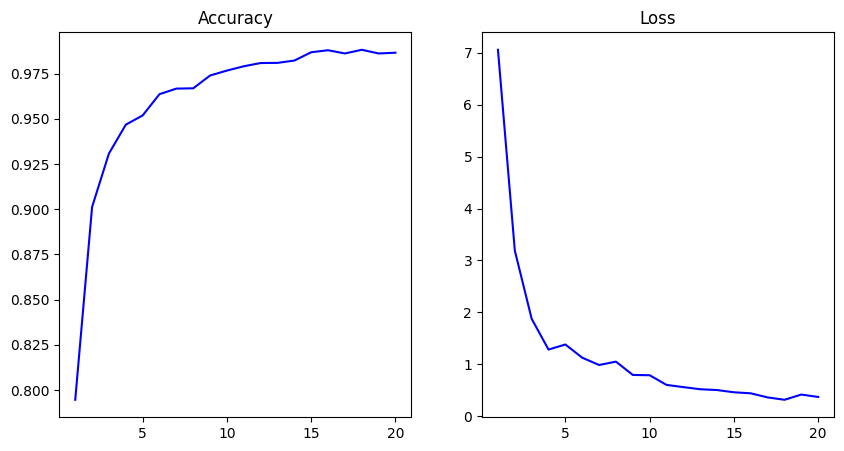

In [ ]:
# model
seg_model = SegmentationNN()

# train the model
history = seg_model.forward(x_train, y_train)

#plot training loss and training accuracy
plot_history(history)

In [ ]:
#print test accuracy
predictions = seg_model.predict(x_test)

# reversing one hot encoding
for i, prediction in enumerate(predictions):
    predictions[i] = [1 if x==max(prediction) else 0 for x in prediction]

print("Testing accuracy: ", accuracy_score(y_test, predictions))

92/92 [==============================] - 19s 158ms/step
Testing accuracy:  0.8534423994546694


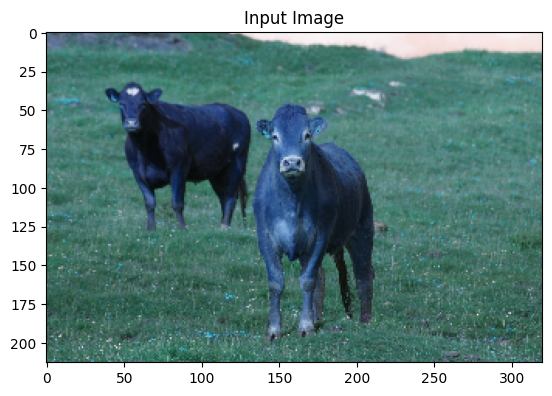

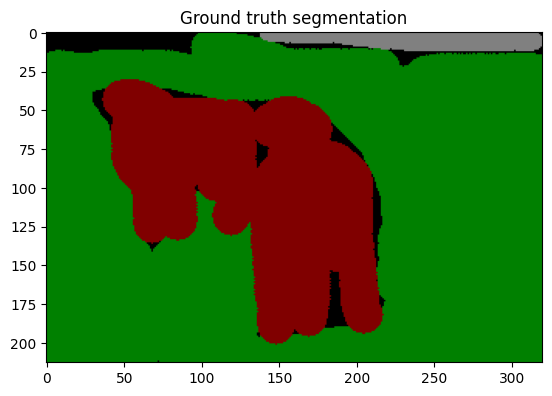

3/3 [==============================] - 2s 1s/step


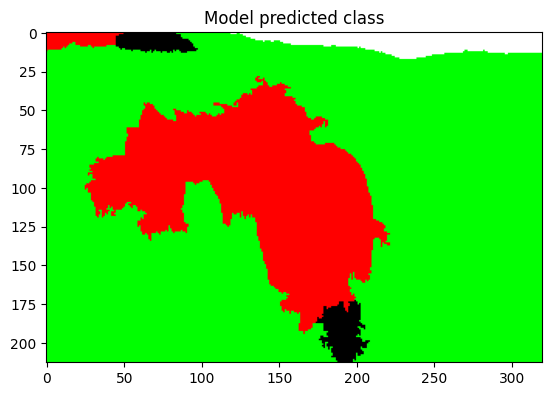

In [ ]:
# plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.
clusters = a.__getitem__(10)
sample_image = cv2.imread(a.img_name)
plt.imshow(sample_image)
plt.title("Input Image")
plt.show()

ground_truth = cv2.imread(a.img_name[:-4] + '_GT.bmp')
plt.imshow(ground_truth)
plt.title('Ground truth segmentation')
plt.show()

X_test = []
y_test = []

for cluster in clusters:
    im = clusters[cluster]['superpixel_image']
    c = clusters[cluster]['superpixel_class']
    X_test.append(np.array(im))
    y_test.append(c)

X_test = np.array(X_test)
predictions = seg_model.predict(X_test)
labels = [0] * len(predictions)

for i, prediction in enumerate(predictions):
    predictions[i] = [1 if x==max(prediction) else 0 for x in prediction]
    labels[i] = np.where(predictions[i] == 1)[0][0] - 1

slic_clusters = slic(sample_image, n_segments=100, compactness=10)
slic_clusters = np.array(slic_clusters)

empty_img = np.zeros(sample_image.shape)

unique_value = np.unique(slic_clusters)

for i in unique_value:
  mask = (slic_clusters==i)
  empty_img[:, :, 0][mask] = label_2_rgb[labels[i-1]][0]
  empty_img[:, :, 1][mask] = label_2_rgb[labels[i-1]][1]
  empty_img[:, :, 2][mask] = label_2_rgb[labels[i-1]][2]

plt.imshow(empty_img)
plt.title('Model predicted class')
plt.show()

### Question 9: Bonus Question (20 points, OPTIONAL):

IMPORTANT: No matter which option you choose, you can earn a maximum of 20 points for this section.

We always want to increase the classifier accuracy and achieve a better performance by building a complicated deep learning model. There are a lot of tricks which are very popular and work in practice. Try to implement either of following two,

1. Could you effictively fuse different deep features from multiple layers in your network? You are welcome to use the pretrained network. Does your network achieve a better accuracy? There are a lot of exploration in the literature, including ION (Inside-Outside Net) [1], Hypercolumns [2], and PixelNet [3]. The following figure illustrates ION architecture combining features from different layers. Can you do similar thing for our Superpixel classifier?

2. Could you build a Multi-resolution network to explore the effectiveness of the multi-scale on the task of Superpixels segmentation? By multi-scale, we mean multiple resolutions of superpixels. See [4] for an example.

[1] Inside-Outside Net: Detecting Objects in Context with Skip Pooling and Recurrent Neural Networks

[2] Hypercolumns for Object Segmentation and Fine-grained Localization

[3] PixelNet: Representationofthe pixels, by the pixels, and for the pixels

[4] Feedforward semantic segmentation with zoom-out features

In [ ]:
# Bonus
